## Band structure calculation for silicane

In [1]:
import sisl as si
import sisl.viz
import plotly.express as px
import numpy as np
import matplotlib.pyplot as plt

Per crear l'esctructura del silicane

In [2]:
# Paràmetres de la cel·la i estructura
bond_length1 = 2.31  # Å (Si-Si bond)
bond_length2 = 1.51 # Å (Si-H bond)
lattice_constant = 3.78  # Å (hexagonal unit cell)
buckling = 0.74  # Å (vertical displacement)

In [3]:
lattice = si.Lattice([
    [lattice_constant, 0, 0],
    [-lattice_constant/2, lattice_constant*np.sqrt(3)/2, 0],
    [0, 0, 20]
])

In [4]:
coords = [
    [0.0, 0.0, -buckling/2],  # Si (A)
    [lattice_constant/2, lattice_constant/(2*np.sqrt(3)), buckling/2],  # Si (B)
    [0.0, 0.0, -buckling/2 - bond_length2],  # H bonded to Si (A)
    [lattice_constant/2, lattice_constant/(2*np.sqrt(3)), buckling/2 + bond_length2]  # H bonded to Si (B)
]
atoms = [si.Atom(14), si.Atom(14), si.Atom(1), si.Atom(1)]

In [5]:
silicane = si.Geometry(
    coords,
    atoms,
    lattice,
).tile(6, 0).tile(6, 1)

In [6]:
print(silicane)

Geometry{na: 144, no: 144,
 Atoms{species: 2,
  Atom{Si, Z: 14, mass(au): 28.08550, maxR: -1.00000,
   Orbital{R: -1.00000, q0: 0.0}
  }: 72,
  Atom{H, Z: 1, mass(au): 1.00794, maxR: -1.00000,
   Orbital{R: -1.00000, q0: 0.0}
  }: 72,
 },
 maxR: -1.00000,
 Lattice{nsc: [1 1 1],
  origin=[0.0000, 0.0000, 0.0000],
  A=[22.6800, 0.0000, 0.0000],
  B=[-11.3400, 19.6415, 0.0000],
  C=[0.0000, 0.0000, 20.0000],
  bc=[Periodic,
      Periodic,
      Periodic]
 }
}


In [13]:
fdf_filename = 'silicane.fdf'
silicane.write(fdf_filename)

In [29]:
from google.colab import files
files.download('silicane.fdf')

ModuleNotFoundError: No module named 'google'

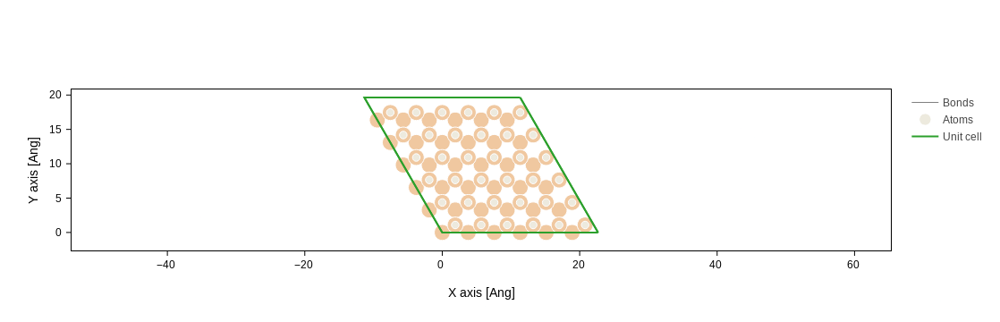

In [14]:
silicane.plot(axes="x,y")

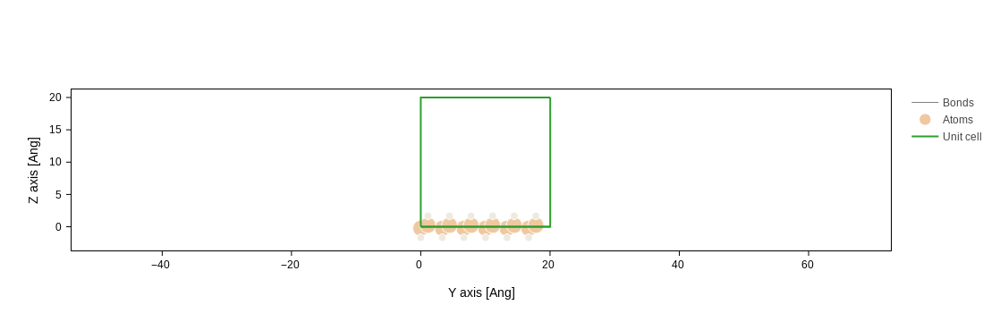

In [8]:
silicane.plot(axes="y,z")

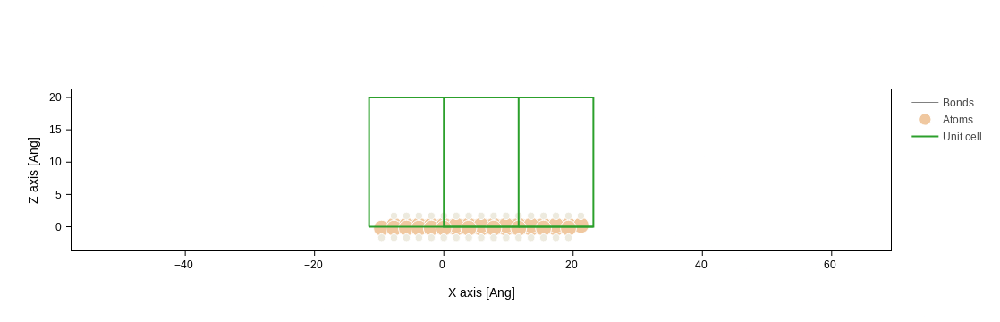

In [10]:
silicane.plot(axes="x,z")

After creating the silicane structure, it's time for the calculation with Siesta. It's important to obtain the Hamiltonian

ANALYSIS OF BAND ELECTRONIC STRUCTURE
-----
From now on, instead of working in a Google Colab, we will work in a Jupyter Notebook for the analysis.

In [9]:
H = si.get_sile("band_structure.fdf").read_hamiltonian()

In [10]:
print(H)

Hamiltonian{non-zero: 458104, orthogonal: False,
 Spin{unpolarized, kind=f},
 Geometry{na: 144, no: 1296,
  Atoms{species: 2,
   Atom{Si, Z: 14, mass(au): 28.09000, maxR: 3.21798,
    AtomicOrbital{3sZ1, q0: 2.0, SphericalOrbital{l: 0, R: 2.591814630109256, q0: 2.0}},
    AtomicOrbital{3sZ2, q0: 0.0, SphericalOrbital{l: 0, R: 1.9302705752411176, q0: 0.0}},
    AtomicOrbital{3pyZ1, q0: 0.6666666666666666, SphericalOrbital{l: 1, R: 3.217983162201961, q0: 2.0}},
    AtomicOrbital{3pzZ1, q0: 0.6666666666666666, SphericalOrbital{l: 1, R: 3.217983162201961, q0: 2.0}},
    AtomicOrbital{3pxZ1, q0: 0.6666666666666666, SphericalOrbital{l: 1, R: 3.217983162201961, q0: 2.0}},
    AtomicOrbital{3pyZ2, q0: 0.0, SphericalOrbital{l: 1, R: 2.42108208515784, q0: 0.0}},
    AtomicOrbital{3pzZ2, q0: 0.0, SphericalOrbital{l: 1, R: 2.42108208515784, q0: 0.0}},
    AtomicOrbital{3pxZ2, q0: 0.0, SphericalOrbital{l: 1, R: 2.42108208515784, q0: 0.0}},
    AtomicOrbital{3dxyZ1P, q0: 0.0, SphericalOrbital{l: 2, 

## Bands

Using sisl we can plot the graphene band structure following the same path as in the official SIESTA example $\Gamma > M > K > \Gamma$.


In [23]:
# We need to define a path of k points
band_struct = sisl.BandStructure(H, points=[[0, 0, 0], [1/3, 0, 0], [1/3, 1/3, 1/3],[0 ,0 ,0]],
    divisions=100, names=[r"Г ", "M", "K","Г"]
)

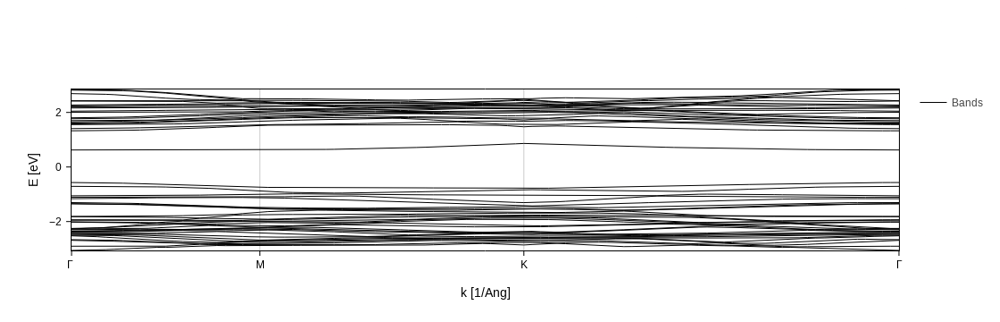

In [24]:
# Then we can plot the bands
band_struct.plot(bands_range=[150,200])

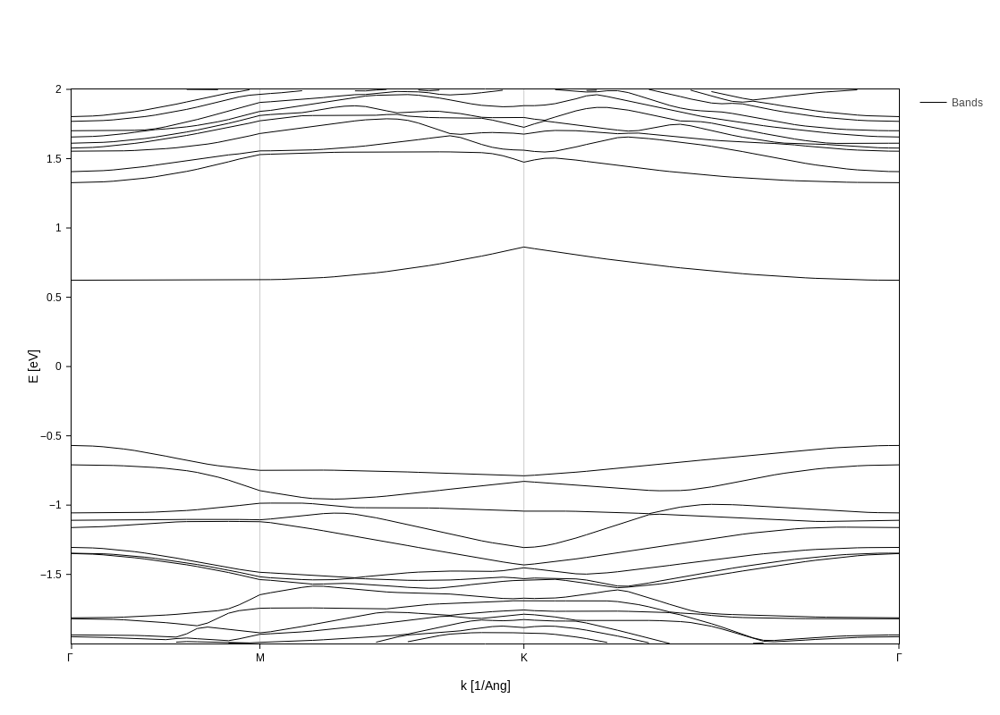

In [19]:
band_struct.plot(Erange=[-2,2]).update_layout(height=800)


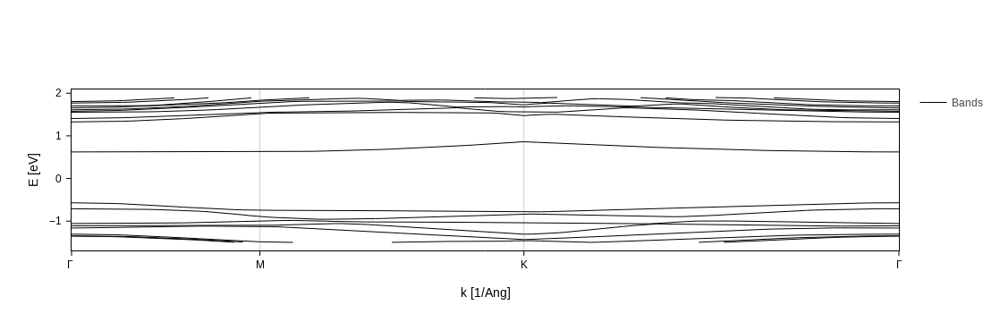

In [12]:
band_struct.plot(Erange=[-2,2])

## Fatbands

In fatbands, the width of each band represents the coefficient of a particular basis orbital for that band at that k-point. Usually, you draw multiple orbitals (or groups of orbitals), each in one colour. The **wider the band is for a given color, the more contribution of the orbital to the state** (bigger coefficient).

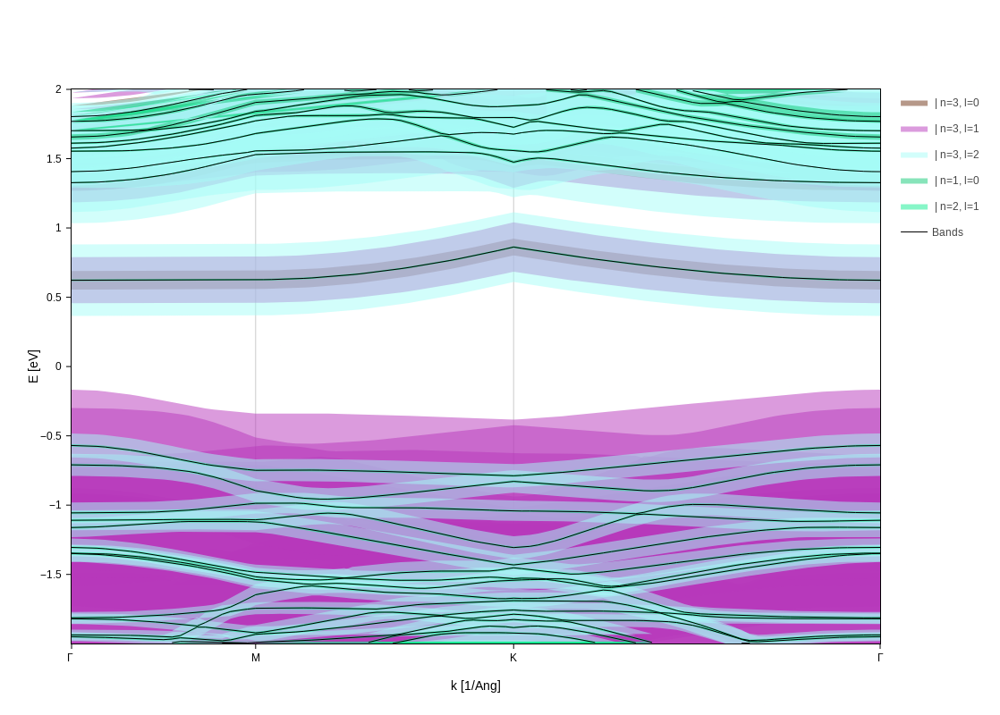

In [27]:
# Get the fatbands plot
fatbands = band_struct.plot.fatbands(Erange=[-2,2])
# Split the contributions by the n and l quantum numbers
fatbands.split_groups(on="n+l")
fatbands.update_layout(height=800)

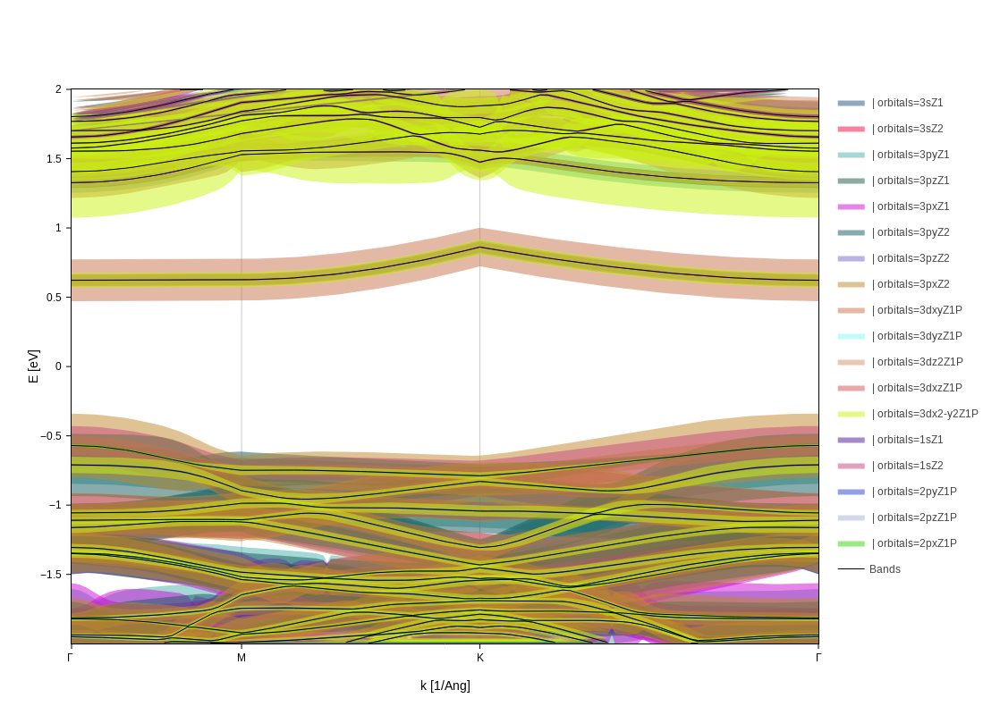

In [28]:
# Get the fatbands plot
fatbands = band_struct.plot.fatbands(Erange=[-2,2])
# Split the contributions by orbitals
fatbands.split_groups(on="orbitals")
fatbands.update_layout(height=800)

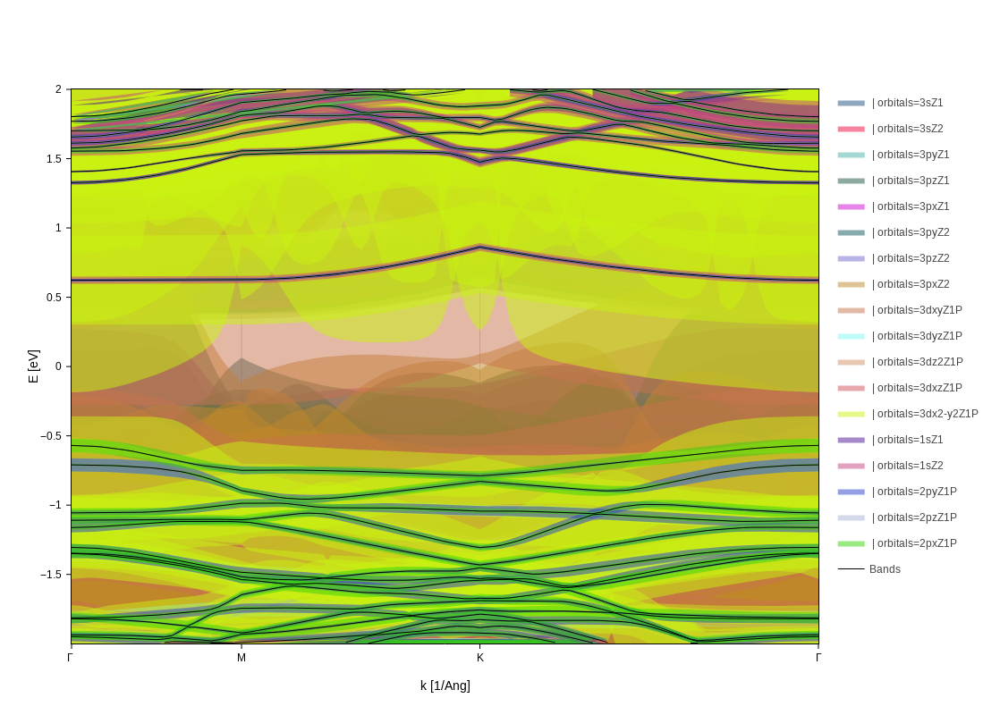

In [31]:
fatbands.update_inputs(fatbands_scale=6)
fatbands.update_layout(height=800)